In [125]:
from PIL import Image
import numpy as np 

In [146]:
from datasets import load_dataset
dataset = load_dataset("huggan/selfie2anime", split="train")

Using custom data configuration huggan--selfie2anime-2601eb6cdec450c3
Reusing dataset parquet (/home/ayushraina/.cache/huggingface/datasets/huggan___parquet/huggan--selfie2anime-2601eb6cdec450c3/0.0.0/7328ef7ee03eaf3f86ae40594d46a1cec86161704e02dd19f232d81eee72ade8)


In [147]:
print(dataset)

Dataset({
    features: ['imageA', 'imageB'],
    num_rows: 3400
})


In [148]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


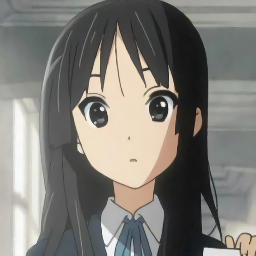

In [149]:
image = dataset["imageB"][5]
image

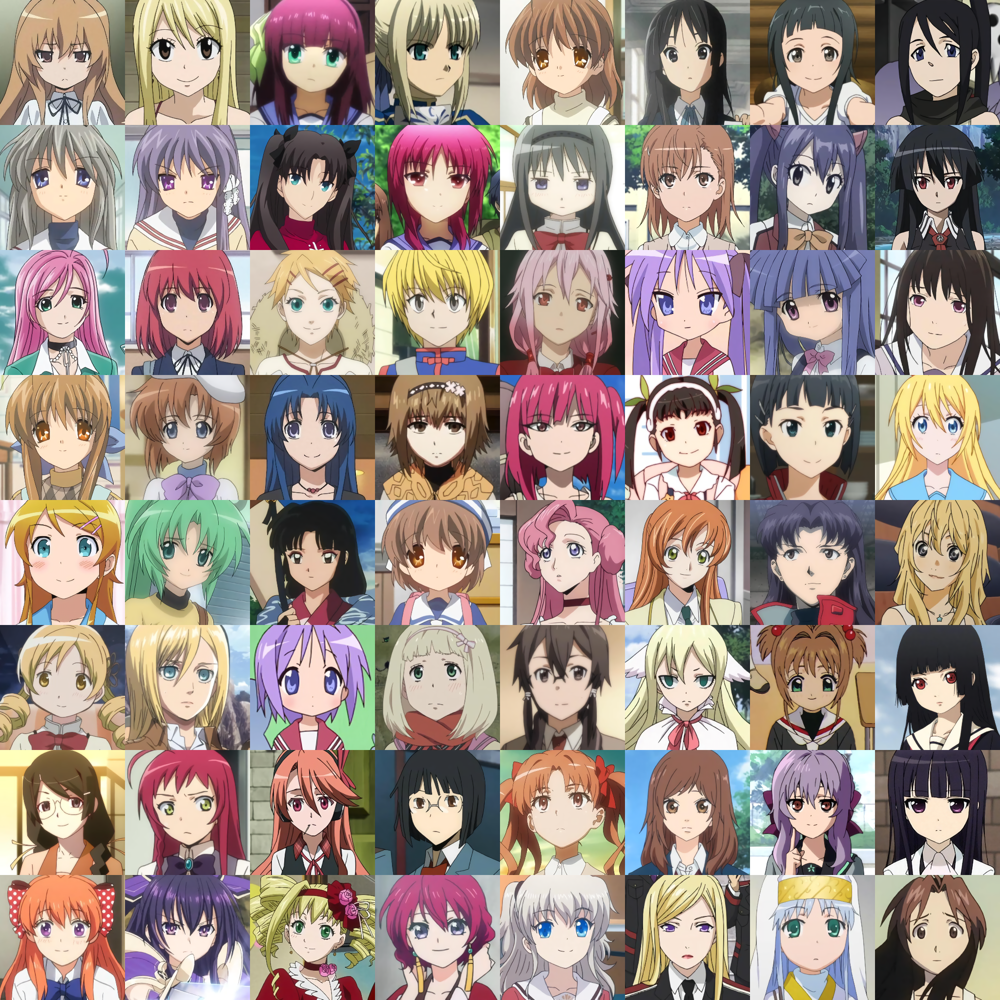

In [150]:
# Display 4*4 grid of images
from diffusers.utils import make_image_grid
make_image_grid(dataset["imageB"][:64],rows=8,cols=8)

In [131]:
# Generate random noise
noise = 256*np.random.rand(256,256,3)

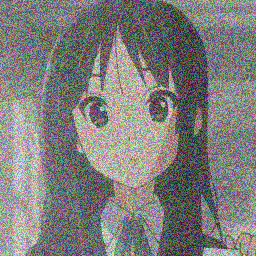

In [132]:
# Adding noise to a sample image
noisy_image = ((image+noise)/2).astype(np.uint8)
Image.fromarray(noisy_image)

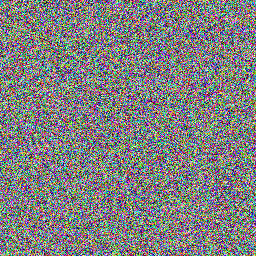

In [133]:
# Noise added to previous image
Image.fromarray(noise.astype(np.uint8))


In [160]:
# Processing Dataset
from torchvision import transforms
transform_pipeline = transforms.Compose([
    transforms.Resize((128,128)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5])
])

In [161]:
def transform(examples):
    images = [transform_pipeline(image) for image in examples["imageB"]]
    
    return {"imageB": images}

dataset.set_transform(transform)

In [162]:
import torch

batch_size = 16
trainLoader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [163]:
# Adding Noise to Data
from diffusers import DDPMScheduler
noise_scheduler = DDPMScheduler(num_train_timesteps=1000)

In [164]:
cleanImages = next(iter(trainLoader))["imageB"]


In [165]:
noise = torch.randn(cleanImages.shape, device=cleanImages.device)
print(noise.shape)

torch.Size([16, 3, 128, 128])


In [166]:
# Sample random timestep for each image
timesteps = torch.arange(10,161,10,dtype=torch.int)
bs = cleanImages.shape[0]

# Add noise to clean images accordingt to magnitude of noise
noisy_images = noise_scheduler.add_noise(cleanImages, noise, timesteps)

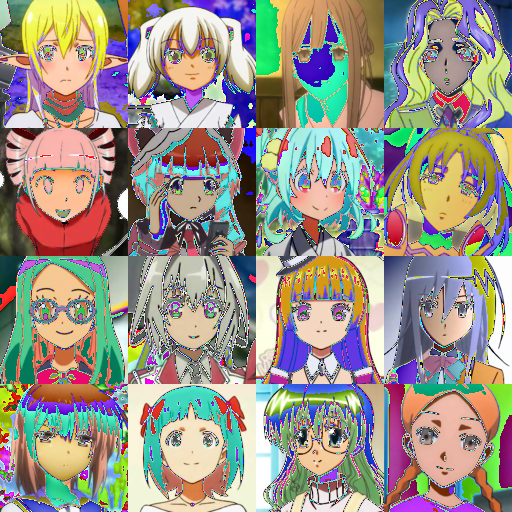

In [167]:
make_image_grid([transforms.ToPILImage()(image) for image in cleanImages],rows=4,cols=4)

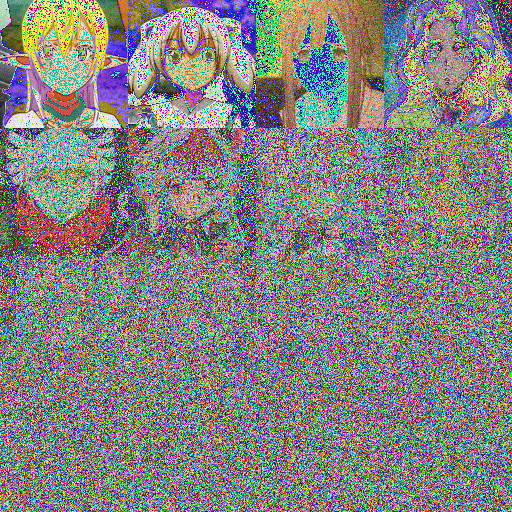

In [168]:
make_image_grid([transforms.ToPILImage()(image) for image in noisy_images],rows=4,cols=4)